## notebook for final project

In [23]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt   #Data visualisation libraries 
import seaborn as sns
import pandas_profiling
# check version number
import imblearn

In [2]:
print('Hello Capstone Project Course!')

Hello Capstone Project Course!


In [101]:
df  = pd.read_csv("Data-Collisions.csv") 
df_backup=df

C:\Users\yaaharar\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## data understanding

In [ ]:
df.head() # show first 5 rows

In [ ]:
df.tail() # last 5 rows

In [ ]:
df.columns # list all column names

In [ ]:
df.shape # get number of rows and columns

In [ ]:
df.info() # additional info about dataframe

In [ ]:
df['SEVERITYCODE'].count()

In [26]:
df.isna().sum()/df['SEVERITYCODE'].count() # sum how many NA are there


In [ ]:
df.describe() # statistical description, only for numeric values


In [ ]:
from IPython.display import display
display(df)  # OR

In [ ]:
pandas_profiling.ProfileReport(df)


In [ ]:
# check correlations
correlation_df = df.corr()
print(correlation_df)

In [106]:
list(df)

['X',
 'Y',
 'OBJECTID',
 'INCKEY',
 'COLDETKEY',
 'REPORTNO',
 'STATUS',
 'ADDRTYPE',
 'SEVERITYDESC',
 'COLLISIONTYPE',
 'PERSONCOUNT',
 'PEDCOUNT',
 'PEDCYLCOUNT',
 'VEHCOUNT',
 'INCDATE',
 'INCDTTM',
 'JUNCTIONTYPE',
 'SDOT_COLCODE',
 'SDOT_COLDESC',
 'UNDERINFL',
 'WEATHER',
 'ROADCOND',
 'LIGHTCOND',
 'ST_COLCODE',
 'ST_COLDESC',
 'SEGLANEKEY',
 'CROSSWALKKEY',
 'HITPARKEDCAR']

In [102]:
#drop severity column since it is the same as y
df.drop(columns=['SEVERITYCODE.1'],inplace=True)


In [110]:
df.head(10)

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,SEVERITYDESC,COLLISIONTYPE,...,SDOT_COLDESC,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,Injury Collision,Angles,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",N,Overcast,Wet,Daylight,10,Entering at angle,0,0,N
1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,Property Damage Only Collision,Sideswipe,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",0,Raining,Wet,Dark - Street Lights On,11,From same direction - both going straight - bo...,0,0,N
2,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,Property Damage Only Collision,Parked Car,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",0,Overcast,Dry,Daylight,32,One parked--one moving,0,0,N
3,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,Property Damage Only Collision,Other,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",N,Clear,Dry,Daylight,23,From same direction - all others,0,0,N
4,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,Injury Collision,Angles,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,Raining,Wet,Daylight,10,Entering at angle,0,0,N
5,-122.387598,47.690575,6,320840,322340,E919477,Matched,Intersection,Property Damage Only Collision,Angles,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",N,Clear,Dry,Daylight,10,Entering at angle,0,0,N
6,-122.338485,47.618534,7,83300,83300,3282542,Matched,Intersection,Property Damage Only Collision,Angles,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,Raining,Wet,Daylight,10,Entering at angle,0,0,N
7,-122.320780,47.614076,9,330897,332397,EA30304,Matched,Intersection,Injury Collision,Cycles,...,PEDALCYCLIST STRUCK MOTOR VEHICLE FRONT END AT...,N,Clear,Dry,Daylight,5,Vehicle Strikes Pedalcyclist,6855,0,N
8,-122.335930,47.611904,10,63400,63400,2071243,Matched,Block,Property Damage Only Collision,Parked Car,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,Clear,Dry,Daylight,32,One parked--one moving,0,0,N
9,-122.384700,47.528475,12,58600,58600,2072105,Matched,Intersection,Injury Collision,Angles,...,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,Clear,Dry,Daylight,10,Entering at angle,0,0,N


In [118]:
#drop columns with more than 40% missing data
deleted=['INCDTTM']
df.drop(columns=deleted,inplace=True)

In [80]:
df.loc[(df.UNDERINFL == '0'),'UNDERINFL']='N'
df.loc[(df.UNDERINFL == '1'),'UNDERINFL']='Y'

In [81]:
df.UNDERINFL.value_counts()

N    53566
Y     2476
Name: UNDERINFL, dtype: int64

In [111]:
list(df)

['X',
 'Y',
 'OBJECTID',
 'INCKEY',
 'COLDETKEY',
 'REPORTNO',
 'STATUS',
 'ADDRTYPE',
 'SEVERITYDESC',
 'COLLISIONTYPE',
 'PERSONCOUNT',
 'PEDCOUNT',
 'PEDCYLCOUNT',
 'VEHCOUNT',
 'INCDATE',
 'INCDTTM',
 'JUNCTIONTYPE',
 'SDOT_COLCODE',
 'SDOT_COLDESC',
 'UNDERINFL',
 'WEATHER',
 'ROADCOND',
 'LIGHTCOND',
 'ST_COLCODE',
 'ST_COLDESC',
 'SEGLANEKEY',
 'CROSSWALKKEY',
 'HITPARKEDCAR']

In [78]:
df.groupby(['JUNCTIONTYPE','SEVERITYCODE']).size()

JUNCTIONTYPE                                       SEVERITYCODE
At Intersection (but not related to intersection)  1                 494
                                                   2                 206
At Intersection (intersection related)             1               12259
                                                   2                9556
Driveway Junction                                  1                2350
                                                   2                1413
Mid-Block (but intersection related)               1                4570
                                                   2                2516
Mid-Block (not related to intersection)            1               16026
                                                   2                6594
Ramp Junction                                      1                  41
                                                   2                  17
dtype: int64

In [63]:
listy=df['INCDATE'].value_counts().head(1000).keys().tolist()

In [112]:
df['INCDATE']=pd.to_datetime(df['INCDATE']).dt.dayofweek

In [115]:
pandas_profiling.ProfileReport(df)

In [113]:
#drop rows with NA
df=df.dropna()

In [114]:
df.isna().sum()

X                0
Y                0
OBJECTID         0
INCKEY           0
COLDETKEY        0
REPORTNO         0
STATUS           0
ADDRTYPE         0
SEVERITYDESC     0
COLLISIONTYPE    0
PERSONCOUNT      0
PEDCOUNT         0
PEDCYLCOUNT      0
VEHCOUNT         0
INCDATE          0
INCDTTM          0
JUNCTIONTYPE     0
SDOT_COLCODE     0
SDOT_COLDESC     0
UNDERINFL        0
WEATHER          0
ROADCOND         0
LIGHTCOND        0
ST_COLCODE       0
ST_COLDESC       0
SEGLANEKEY       0
CROSSWALKKEY     0
HITPARKEDCAR     0
dtype: int64

In [119]:
df_back=df

In [39]:
df['SEVERITYCODE'].value_counts()

1    124258
2     55809
Name: SEVERITYCODE, dtype: int64

In [120]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# get numeric data
num_d = df.select_dtypes(exclude=['object'])

# update the cols with their normalized values
df[num_d.columns] = scaler.fit_transform(num_d)



#df_norm=sc.transform(df)

<ipython-input-120-58e6e8493062>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[num_d.columns] = scaler.fit_transform(num_d)
C:\Users\yaaharar\Anaconda3\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [121]:
# Undersampling
y=df['SEVERITYDESC']
X=df[df.columns.difference(['SEVERITYDESC'])]
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(sampling_strategy='majority')
X_over, y_over = undersample.fit_resample(X, y)
y_over.value_counts()

Injury Collision                  55809
Property Damage Only Collision    55809
Name: SEVERITYDESC, dtype: int64

In [122]:
X_over=pd.get_dummies(X_over)

# MODELLING

In [123]:
X=X_over
y=y_over

### split train test


In [124]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

## Logistic

C:\Users\yaaharar\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7106477710810664
[[14894  3618]
 [ 7040 11282]]


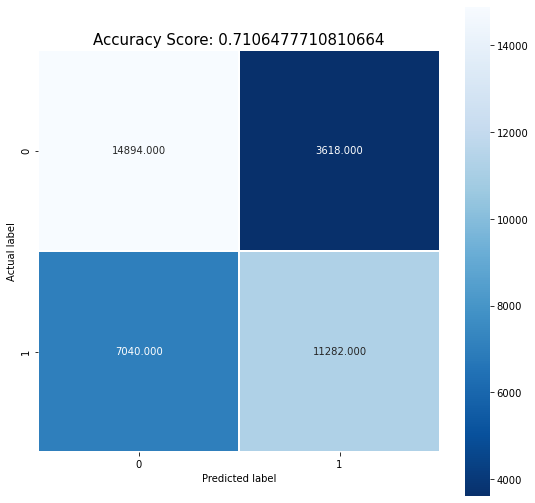

In [130]:
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression()
logisticRegr.fit(X_train, y_train)
logisticRegr.predict(X_test)
# Use score method to get accuracy of model
score = logisticRegr.score(X_test, y_test)
print(score)
from sklearn import metrics
predictions = logisticRegr.predict(X_test)
cm = metrics.confusion_matrix(y_test, predictions)
print(cm)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [132]:

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier

In [137]:
y_train_back=y_train
y_test_back=y_test

In [139]:
y_train

11873                   Injury Collision
79070     Property Damage Only Collision
17987                   Injury Collision
79085     Property Damage Only Collision
8099                    Injury Collision
                       ...              
76820     Property Damage Only Collision
110268    Property Damage Only Collision
103694    Property Damage Only Collision
860                     Injury Collision
15795                   Injury Collision
Name: SEVERITYDESC, Length: 74784, dtype: object

In [142]:
y_test=y_test.replace('Injury Collision', 1)
y_test=y_test.replace('Property Damage Only Collision', 0)


In [152]:
#clf = LogisticRegression()
clf = AdaBoostClassifier()
#clf = RandomForestClassifier(max_depth=4, random_state=0)

              precision    recall  f1-score   support

           0       0.74      0.65      0.69     18322
           1       0.69      0.77      0.73     18512

    accuracy                           0.71     36834
   macro avg       0.71      0.71      0.71     36834
weighted avg       0.71      0.71      0.71     36834



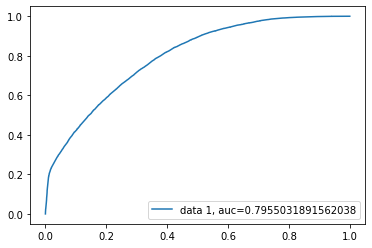

In [153]:
# train the model on train set 
clf.fit(X_train, y_train) 

predictions = clf.predict(X_test) 

prob=clf.predict_proba(X_test)
y_pred_proba = clf.predict_proba(X_test)[::,1]

# print classification report 
print(classification_report(y_test, predictions)) 
#TEST_roc=roc_auc_score(y_test, predictions)
#print(f'test AUC= {TEST_roc}')
import scikitplot as skplt
import matplotlib.pyplot as plt

#y_probas = # predicted probabilities generated by sklearn classifier
#skplt.metrics.plot_roc_curve(y_test, prob)
#plt.show()

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

[[11949  6373]
 [ 4245 14267]]


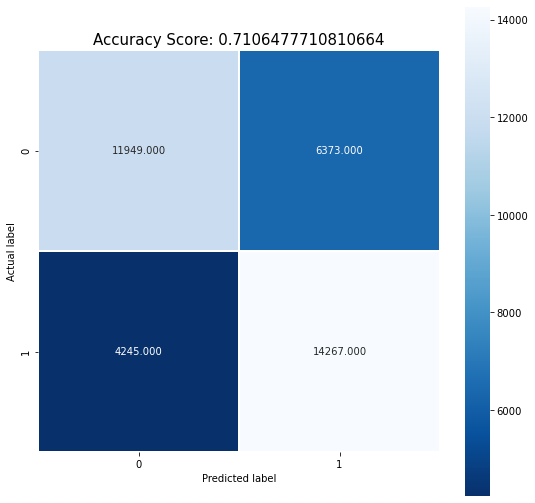

In [154]:
from sklearn import metrics
predictions = clf.predict(X_test)
cm = metrics.confusion_matrix(y_test, predictions)
print(cm)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

C:\Users\yaaharar\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


              precision    recall  f1-score   support

           0       0.76      0.62      0.68     18322
           1       0.68      0.80      0.74     18512

    accuracy                           0.71     36834
   macro avg       0.72      0.71      0.71     36834
weighted avg       0.72      0.71      0.71     36834



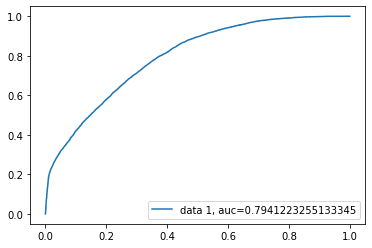

In [145]:
clf = LogisticRegression()
#clf = AdaBoostClassifier()
#clf = RandomForestClassifier(max_depth=4, random_state=0)
# train the model on train set 
clf.fit(X_train, y_train) 

predictions = clf.predict(X_test) 

prob=clf.predict_proba(X_test)
y_pred_proba = clf.predict_proba(X_test)[::,1]

# print classification report 
print(classification_report(y_test, predictions)) 
#TEST_roc=roc_auc_score(y_test, predictions)
#print(f'test AUC= {TEST_roc}')
import scikitplot as skplt
import matplotlib.pyplot as plt

#y_probas = # predicted probabilities generated by sklearn classifier
#skplt.metrics.plot_roc_curve(y_test, prob)
#plt.show()

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

              precision    recall  f1-score   support

           0       0.74      0.59      0.66     18322
           1       0.66      0.79      0.72     18512

    accuracy                           0.69     36834
   macro avg       0.70      0.69      0.69     36834
weighted avg       0.70      0.69      0.69     36834



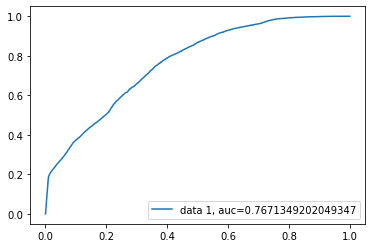

In [157]:
#clf = LogisticRegression()
#clf = AdaBoostClassifier()
clf = RandomForestClassifier(max_depth=4, random_state=0)
# train the model on train set 
clf.fit(X_train, y_train) 

predictions = clf.predict(X_test) 

prob=clf.predict_proba(X_test)
y_pred_proba = clf.predict_proba(X_test)[::,1]

# print classification report 
print(classification_report(y_test, predictions)) 
#TEST_roc=roc_auc_score(y_test, predictions)
#print(f'test AUC= {TEST_roc}')
import scikitplot as skplt
import matplotlib.pyplot as plt

#y_probas = # predicted probabilities generated by sklearn classifier
#skplt.metrics.plot_roc_curve(y_test, prob)
#plt.show()

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

[[10892  7430]
 [ 3812 14700]]


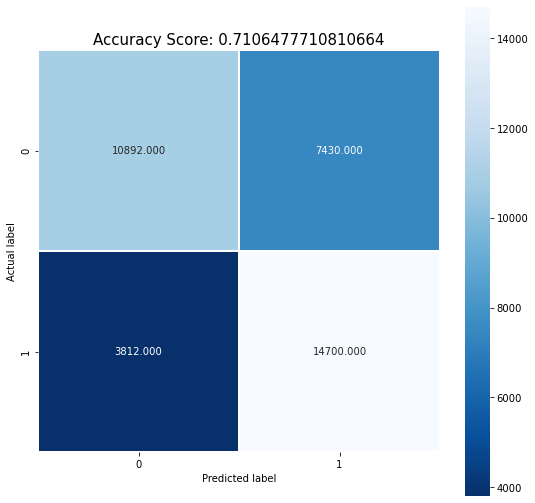

In [158]:
from sklearn import metrics
predictions = clf.predict(X_test)
cm = metrics.confusion_matrix(y_test, predictions)
print(cm)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [149]:
# Import the classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import roc_curve, roc_auc_score

# Instantiate the classfiers and make a list
classifiers = [LogisticRegression(random_state=1234), 
               #GaussianNB(), 
               AdaBoostClassifier(), 
               RandomForestClassifier(random_state=1234)]

# Define a result table as a DataFrame
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

# Train the models and record the results
for cls in classifiers:
    model = cls.fit(X_train, y_train)
    yproba = model.predict_proba(X_test)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)

# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

C:\Users\yaaharar\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


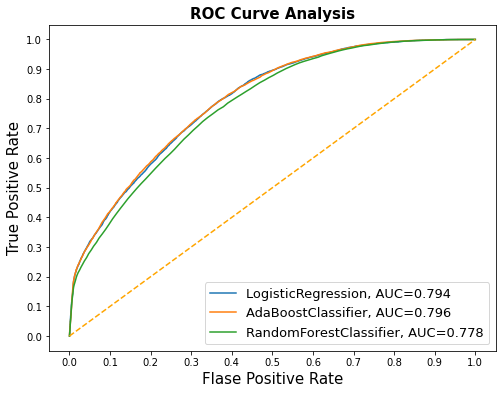

In [150]:
fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()